## UKBB+HCP GLM

### Imports

In [174]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [175]:
from env.imports import *

In [176]:
from models import *
from data import * 
from env import *
from sim import *

In [177]:
# overall imports
import importlib
import data

# data load
from data.data_load import load_transcriptome, load_connectome, load_coords
from data.data_viz import plot_connectome, plot_connectome_with_labels, plot_transcriptome
importlib.reload(data.data_load)
importlib.reload(data.data_viz)


<module 'data.data_viz' from '/scratch/asr655/neuroinformatics/GeneEx2Conn/data/data_viz.py'>

In [178]:
print_system_usage()

total = psutil.disk_usage('/').total
print(bytes2human(total))

CPU Usage: 52.7%
RAM Usage: 7.4%
Available RAM: 349.3G
Total RAM: 377.1G
52.4G


In [179]:
GPUtil.getAvailable()

[]

## Load in connectomes

In [180]:
Y_sc = load_connectome(parcellation='S400', omit_subcortical=False, hemisphere='both', measure='SC')
Y_fc, region_labels, lh_indices, rh_indices = load_connectome(parcellation='S400', omit_subcortical=False, hemisphere='both', measure='FC', include_labels=True)


Text(0.5, 0, 'Genes')

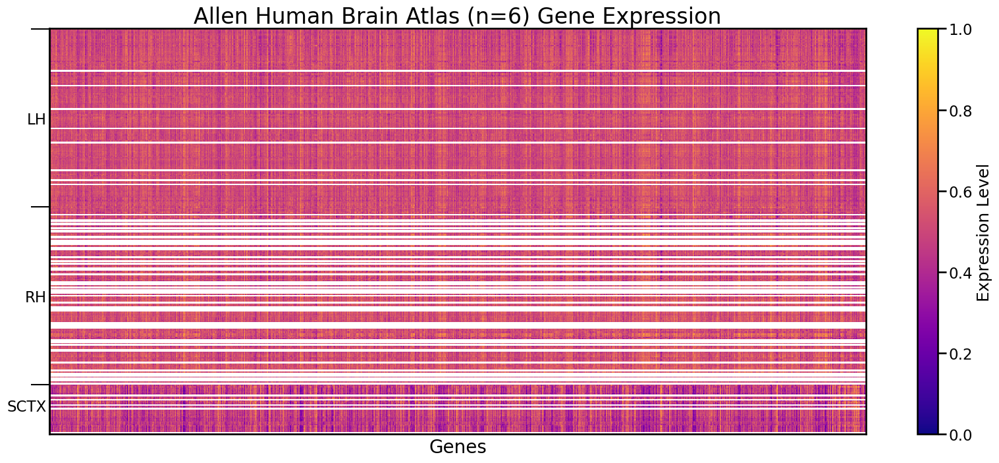

In [181]:
# Sorted
X = load_transcriptome(parcellation='S400', omit_subcortical=False, hemisphere='both', sort_genes=True)

# Visualize transcriptome matrix
plt.figure(figsize=(20, 8))
plt.imshow(X, aspect='auto', cmap='plasma')
plt.colorbar(label='Expression Level')
plt.title('Allen Human Brain Atlas (n=6) Gene Expression', fontsize=24)

# Remove default ticks
plt.gca().set_xticks([])
plt.gca().set_yticks([])

# Add region labels on y-axis
sec_ay = plt.gca().secondary_yaxis(location=0)
sec_ay.set_yticks([100, 300, 423], labels=['LH', 'RH', 'SCTX'])
sec_ay.tick_params('y', length=0)

# Add lines between regions on y-axis
sec_ay_lines = plt.gca().secondary_yaxis(location=0)
sec_ay_lines.set_yticks([0, 200, 400, 456], labels=[])
sec_ay_lines.tick_params('y', length=20, width=1.5)

# Add x-axis label
plt.xlabel('Genes', fontsize=20)


Text(0.5, 0, 'Genes')

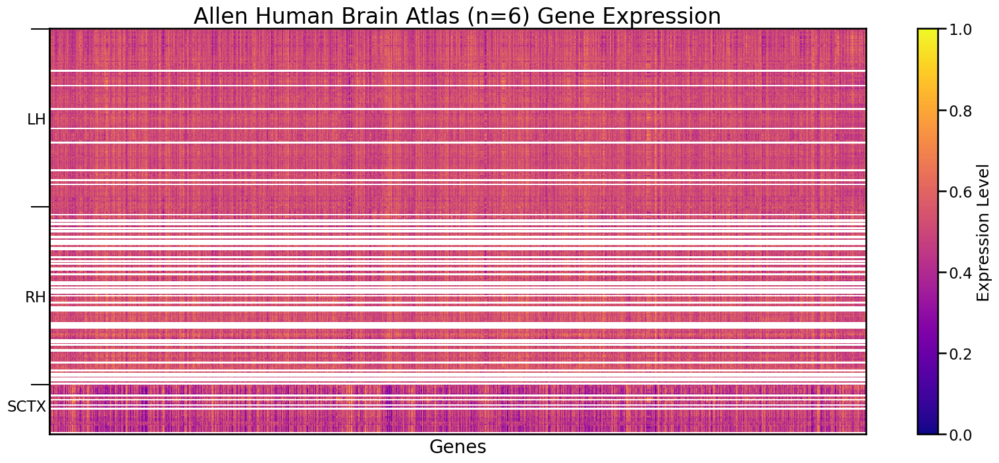

In [182]:
# Unsorted 
X = load_transcriptome(parcellation='S400', omit_subcortical=False, hemisphere='both', sort_genes=False)

# Visualize transcriptome matrix
plt.figure(figsize=(20, 8))
plt.imshow(X, aspect='auto', cmap='plasma')
plt.colorbar(label='Expression Level')
plt.title('Allen Human Brain Atlas (n=6) Gene Expression', fontsize=24)

# Remove default ticks
plt.gca().set_xticks([])
plt.gca().set_yticks([])

# Add region labels on y-axis
sec_ay = plt.gca().secondary_yaxis(location=0)
sec_ay.set_yticks([100, 300, 423], labels=['LH', 'RH', 'SCTX'])
sec_ay.tick_params('y', length=0)

# Add lines between regions on y-axis
sec_ay_lines = plt.gca().secondary_yaxis(location=0)
sec_ay_lines.set_yticks([0, 200, 400, 456], labels=[])
sec_ay_lines.tick_params('y', length=20, width=1.5)

# Add x-axis label
plt.xlabel('Genes', fontsize=20)


valid genes ['A1BG', 'A1BG-AS1', 'AACS', 'AAK1', 'AAMDC', 'AARD', 'AARS', 'AARS2', 'AASDH', 'AASS', 'AATF', 'ABCA1', 'ABCA6', 'ABCA9', 'ABCB6', 'ABCB7', 'ABCC12', 'ABCC5', 'ABCC6', 'ABCC8', 'ABCD2', 'ABCE1', 'ABCF1', 'ABCF2', 'ABCG1', 'ABCG2', 'ABCG4', 'ABHD1', 'ABHD12', 'ABHD12B', 'ABHD13', 'ABHD17A', 'ABHD17B', 'ABHD17C', 'ABHD3', 'ABHD4', 'ABHD6', 'ABHD8', 'ABI1', 'ABLIM2', 'ABR', 'ABRACL', 'ABTB1', 'ABTB2', 'ACAA2', 'ACACB', 'ACADL', 'ACAN', 'ACAP3', 'ACAT2', 'ACD', 'ACHE', 'ACKR1', 'ACKR3', 'ACLY', 'ACO1', 'ACO2', 'ACOT13', 'ACOT2', 'ACOT4', 'ACOT8', 'ACOX1', 'ACOX2', 'ACOX3', 'ACP1', 'ACSBG1', 'ACSF2', 'ACSF3', 'ACSL3', 'ACSL4', 'ACSL6', 'ACSM5', 'ACSS3', 'ACTA1', 'ACTC1', 'ACTG1', 'ACTL6A', 'ACTL6B', 'ACTN1', 'ACTN2', 'ACTN4', 'ACTR10', 'ACTR1A', 'ACTR1B', 'ACTR3B', 'ACTR3C', 'ACVR1', 'ACVR1C', 'ACVR2A', 'ACVR2B', 'ACY3', 'ACYP2', 'ADAD2', 'ADAL', 'ADAM11', 'ADAM15', 'ADAM20', 'ADAM20P1', 'ADAM22', 'ADAM23', 'ADAM28', 'ADAM8', 'ADAMTS13', 'ADAMTS19', 'ADAMTS5', 'ADAMTS8', 'ADAMT

Text(0.5, 0, 'Genes')

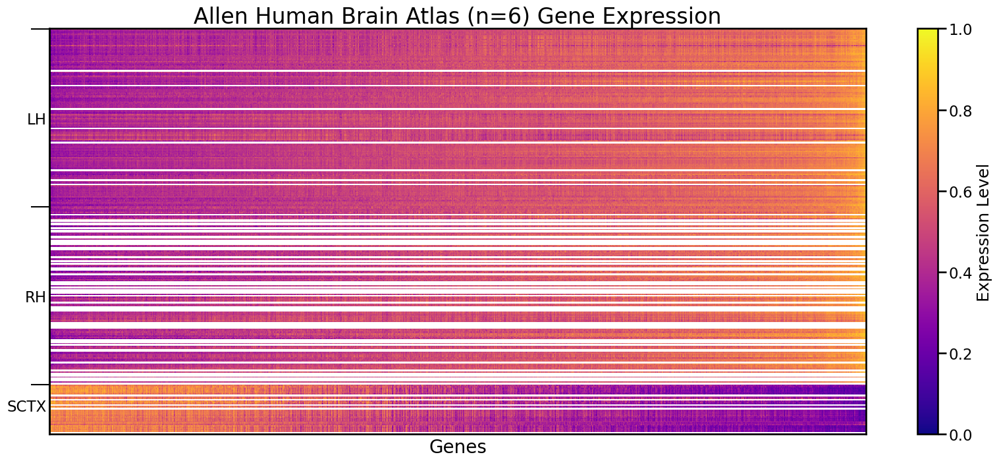

In [183]:
X, valid_genes = load_transcriptome(parcellation='S400', omit_subcortical=False, hemisphere='both', sort_genes=False, return_valid_genes=True)

# Sort columns by mean expression
mean_expr = np.nanmean(X, axis=0)
sort_idx = np.argsort(mean_expr)
X = X[:, sort_idx]

# Get gene names for lowest and highest expression
lowest_20_genes = [valid_genes[i] for i in sort_idx[:20]]
highest_20_genes = [valid_genes[i] for i in sort_idx[-20:]]

print("\n20 genes with lowest average expression:")
print(lowest_20_genes)
print("\n20 genes with highest average expression:")
print(highest_20_genes)

# Visualize transcriptome matrix
plt.figure(figsize=(20, 8))
plt.imshow(X, aspect='auto', cmap='plasma')
plt.colorbar(label='Expression Level')
plt.title('Allen Human Brain Atlas (n=6) Gene Expression', fontsize=24)

# Remove default ticks
plt.gca().set_xticks([])
plt.gca().set_yticks([])

# Add region labels on y-axis
sec_ay = plt.gca().secondary_yaxis(location=0)
sec_ay.set_yticks([100, 300, 423], labels=['LH', 'RH', 'SCTX'])
sec_ay.tick_params('y', length=0)

# Add lines between regions on y-axis
sec_ay_lines = plt.gca().secondary_yaxis(location=0)
sec_ay_lines.set_yticks([0, 200, 400, 456], labels=[])
sec_ay_lines.tick_params('y', length=20, width=1.5)

# Add x-axis label
plt.xlabel('Genes', fontsize=20)

Text(0.5, 0, 'Genes')

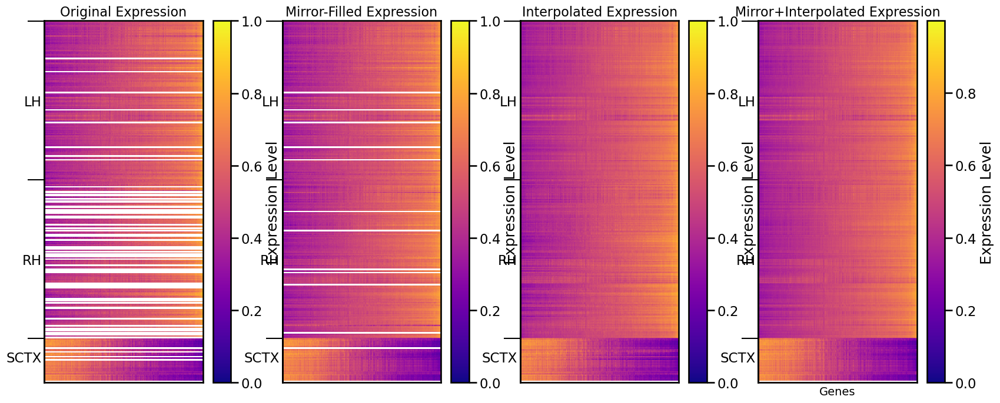

In [184]:

# Load different versions of transcriptome data for reference
X_mirror = load_transcriptome(parcellation='S400', omit_subcortical=False, hemisphere='both', sort_genes=False, resolve_missing='mirror')
X_interpolate = load_transcriptome(parcellation='S400', omit_subcortical=False, hemisphere='both', sort_genes=False, resolve_missing='interpolate')
X_mirror_interpolate = load_transcriptome(parcellation='S400', omit_subcortical=False, hemisphere='both', sort_genes=False, resolve_missing='mirror_interpolate')

# Use same sorting as raw data
X_mirror = X_mirror[:, sort_idx]
X_interpolate = X_interpolate[:, sort_idx] 
X_mirror_interpolate = X_mirror_interpolate[:, sort_idx]
# Visualize all versions
plt.figure(figsize=(20, 8))

plt.subplot(141)
plt.imshow(X, aspect='auto', cmap='plasma')
plt.colorbar(label='Expression Level')
plt.title('Original Expression', fontsize=16)

# Remove default ticks
plt.gca().set_xticks([])
plt.gca().set_yticks([])

# Add region labels on y-axis
sec_ay = plt.gca().secondary_yaxis(location=0)
sec_ay.set_yticks([100, 300, 423], labels=['LH', 'RH', 'SCTX'])
sec_ay.tick_params('y', length=0)

# Add lines between regions on y-axis
sec_ay_lines = plt.gca().secondary_yaxis(location=0)
sec_ay_lines.set_yticks([0, 200, 400, 456], labels=[])
sec_ay_lines.tick_params('y', length=20, width=1.5)

plt.subplot(142)
plt.imshow(X_mirror, aspect='auto', cmap='plasma')
plt.colorbar(label='Expression Level')
plt.title('Mirror-Filled Expression', fontsize=16)

# Remove default ticks
plt.gca().set_xticks([])
plt.gca().set_yticks([])

# Add region labels on y-axis
sec_ay = plt.gca().secondary_yaxis(location=0)
sec_ay.set_yticks([100, 300, 423], labels=['LH', 'RH', 'SCTX'])
sec_ay.tick_params('y', length=0)

# Add lines between regions on y-axis
sec_ay_lines = plt.gca().secondary_yaxis(location=0)
sec_ay_lines.set_yticks([0, 200, 400, 456], labels=[])
sec_ay_lines.tick_params('y', length=20, width=1.5)

plt.subplot(143)
plt.imshow(X_interpolate, aspect='auto', cmap='plasma')
plt.colorbar(label='Expression Level')
plt.title('Interpolated Expression', fontsize=16)

# Remove default ticks
plt.gca().set_xticks([])
plt.gca().set_yticks([])

# Add region labels on y-axis
sec_ay = plt.gca().secondary_yaxis(location=0)
sec_ay.set_yticks([100, 300, 423], labels=['LH', 'RH', 'SCTX'])
sec_ay.tick_params('y', length=0)

# Add lines between regions on y-axis
sec_ay_lines = plt.gca().secondary_yaxis(location=0)
sec_ay_lines.set_yticks([0, 200, 400, 456], labels=[])
sec_ay_lines.tick_params('y', length=20, width=1.5)

plt.subplot(144)
plt.imshow(X_mirror_interpolate, aspect='auto', cmap='plasma')
plt.colorbar(label='Expression Level')
plt.title('Mirror+Interpolated Expression', fontsize=16)

# Remove default ticks
plt.gca().set_xticks([])
plt.gca().set_yticks([])

# Add region labels on y-axis
sec_ay = plt.gca().secondary_yaxis(location=0)
sec_ay.set_yticks([100, 300, 423], labels=['LH', 'RH', 'SCTX'])
sec_ay.tick_params('y', length=0)

# Add lines between regions on y-axis
sec_ay_lines = plt.gca().secondary_yaxis(location=0)
sec_ay_lines.set_yticks([0, 200, 400, 456], labels=[])
sec_ay_lines.tick_params('y', length=20, width=1.5)

# Add x-axis label
plt.xlabel('Genes', fontsize=14)


/scratch/asr655/neuroinformatics/GeneEx2Conn
/scratch/asr655/neuroinformatics/GeneEx2Conn_data/Penn_UKBB_data/
Number of scans: 1959
Number of subjects with valid scans: 1817
Number of clean subjects: 1501


Text(0.5, 0, 'Genes')

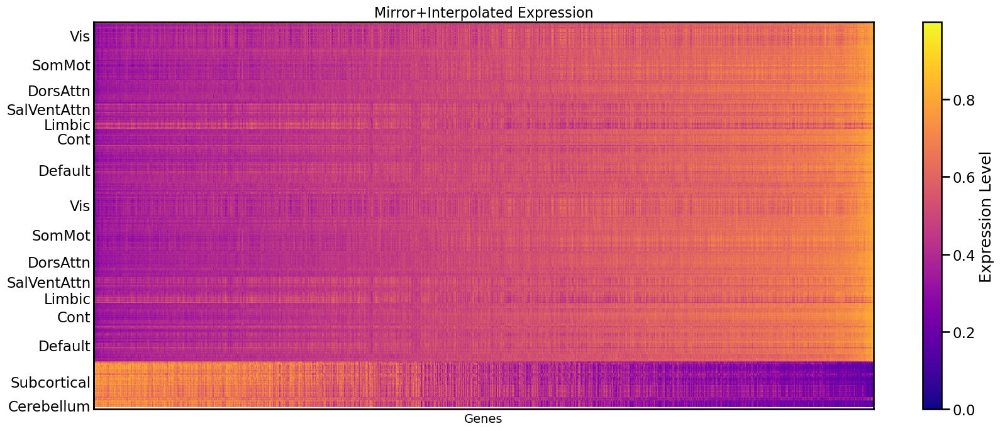

In [185]:
# Set paths
GeneEx2Conn_path = os.path.normpath(os.getcwd())
UKBB_path = os.path.normpath(os.getcwd() + os.sep + os.pardir) + '/GeneEx2Conn_data/Penn_UKBB_data/'
print(GeneEx2Conn_path)
print(UKBB_path)

UKBB_demographics = pd.read_csv(UKBB_path + '/metadata/UKBB_MasterList_DemogInfo_part.csv')
unique_subject_ids = list(set([x.split('-')[1] for x in os.listdir(UKBB_path + '/XCP_D/') if x.startswith('sub-')]))
print(f"Number of scans: {len(unique_subject_ids)}")

with open(GeneEx2Conn_path + '/data/UKBB/UKBB_fMRI_subids.txt', 'r') as f:
    subjects_all = [line.strip() for line in f.readlines()]

with open(GeneEx2Conn_path + '/data/UKBB/UKBB_fMRI_subids_clean.txt', 'r') as f:
    subjects_clean = [line.strip() for line in f.readlines()]

print(f"Number of subjects with valid scans: {len(subjects_all)}")
print(f"Number of clean subjects: {len(subjects_clean)}")


schaef156_atlas_path = UKBB_path + '/atlases/atlas-4S156Parcels/atlas-4S156Parcels_dseg.tsv'
schaef156_atlas_info = pd.read_csv(schaef156_atlas_path, sep='\t')
schaef156_labels = schaef156_atlas_info['label'].tolist()

schaef456_atlas_path = UKBB_path + '/atlases/atlas-4S456Parcels/atlas-4S456Parcels_dseg.tsv'
schaef456_atlas_info = pd.read_csv(schaef456_atlas_path, sep='\t')
schaef456_labels = schaef456_atlas_info['label'].tolist()

schaef156_atlas_info.loc[schaef156_atlas_info['atlas_name'] == 'Cerebellum', 'network_label'] = 'Cerebellum'
schaef156_atlas_info.loc[(schaef156_atlas_info['network_label'].isna()) & 
                        (schaef156_atlas_info['atlas_name'] != 'Cerebellum'), 'network_label'] = 'Subcortical'

schaef456_atlas_info.loc[schaef456_atlas_info['atlas_name'] == 'Cerebellum', 'network_label'] = 'Cerebellum'
schaef456_atlas_info.loc[(schaef456_atlas_info['network_label'].isna()) & 
                        (schaef456_atlas_info['atlas_name'] != 'Cerebellum'), 'network_label'] = 'Subcortical'

schaef156_labels = schaef156_atlas_info['label'].tolist()
schaef156_network_labels = schaef156_atlas_info['network_label'].values
schaef456_labels = schaef456_atlas_info['label'].tolist()
schaef456_network_labels = schaef456_atlas_info['network_label'].values

# Get unique network labels and their positions
unique_networks = []
network_positions = []
prev_network = schaef456_network_labels[0]
start_pos = 0

for i, network in enumerate(schaef456_network_labels):
    if network != prev_network:
        unique_networks.append(prev_network)
        network_positions.append((start_pos + i - 1) / 2)
        start_pos = i
        prev_network = network

# Add final network
unique_networks.append(prev_network)
network_positions.append((start_pos + len(schaef456_network_labels) - 1) / 2)

plt.figure(figsize=(20, 8))

plt.imshow(X_mirror_interpolate, aspect='auto', cmap='plasma')
plt.colorbar(label='Expression Level')
plt.title('Mirror+Interpolated Expression', fontsize=16)

# Remove default ticks
plt.gca().set_xticks([])
plt.gca().set_yticks([])

# Add network labels on y-axis
sec_ay = plt.gca().secondary_yaxis(location=0)
sec_ay.set_yticks(network_positions, labels=unique_networks)
sec_ay.tick_params('y', length=0)

# Add x-axis label
plt.xlabel('Genes', fontsize=14)


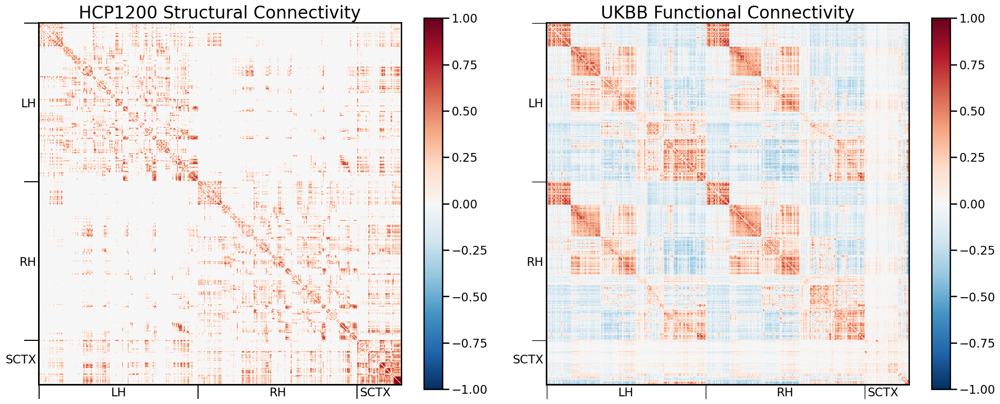

In [186]:
# Visualize structural and functional connectivity matrices
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# Plot structural connectivity
im1 = ax1.imshow(Y_sc, cmap='RdBu_r', vmin=-1, vmax=1)
ax1.set_title('HCP1200 Structural Connectivity', fontsize=24)
plt.colorbar(im1, ax=ax1)

# Remove main ticks
ax1.set_xticks([])
ax1.set_yticks([])
# Secondary axis for region labels - structural
sec_ax1 = ax1.secondary_xaxis(location=0)
sec_ax1.set_xticks([100, 300, 423], labels=['LH', 'RH', 'SCTX'])
sec_ax1.tick_params('x', length=0)

# Add lines between regions - structural x-axis
sec_ax1_lines = ax1.secondary_xaxis(location=0)
sec_ax1_lines.set_xticks([0, 200, 400, 456], labels=[])
sec_ax1_lines.tick_params('x', length=20, width=1.5)

# Secondary axis for region labels - structural y-axis
sec_ay1 = ax1.secondary_yaxis(location=0)
sec_ay1.set_yticks([100, 300, 423], labels=['LH', 'RH', 'SCTX'])
sec_ay1.tick_params('y', length=0)

# Add lines between regions - structural y-axis
sec_ay1_lines = ax1.secondary_yaxis(location=0)
sec_ay1_lines.set_yticks([0, 200, 400, 456], labels=[])
sec_ay1_lines.tick_params('y', length=20, width=1.5)

# Plot functional connectivity
im2 = ax2.imshow(Y_fc, cmap='RdBu_r', vmin=-1, vmax=1)
ax2.set_title('UKBB Functional Connectivity', fontsize=24)
plt.colorbar(im2, ax=ax2)

# Remove main ticks
ax2.set_xticks([])
ax2.set_yticks([])

# Secondary axis for region labels - functional x-axis
sec_ax2 = ax2.secondary_xaxis(location=0)
sec_ax2.set_xticks([100, 300, 423], labels=['LH', 'RH', 'SCTX'])
sec_ax2.tick_params('x', length=0)

# Add lines between regions - functional x-axis
sec_ax2_lines = ax2.secondary_xaxis(location=0)
sec_ax2_lines.set_xticks([0, 200, 400, 456], labels=[])
sec_ax2_lines.tick_params('x', length=20, width=1)

# Secondary axis for region labels - functional y-axis
sec_ay2 = ax2.secondary_yaxis(location=0)
sec_ay2.set_yticks([100, 300, 423], labels=['LH', 'RH', 'SCTX'])
sec_ay2.tick_params('y', length=0)

# Add lines between regions - functional y-axis
sec_ay2_lines = ax2.secondary_yaxis(location=0)
sec_ay2_lines.set_yticks([0, 200, 400, 456], labels=[])
sec_ay2_lines.tick_params('y', length=20, width=1)

plt.tight_layout()
plt.show()


### S456 transcriptome and connectomes

#### Construct the features for the GLM 

All edges

In [188]:
Y_sc = load_connectome(parcellation='S400', omit_subcortical=False, hemisphere='both', measure='SC')
Y_fc, region_labels, lh_indices, rh_indices = load_connectome(parcellation='S400', omit_subcortical=False, hemisphere='both', measure='FC', include_labels=True)

# Store labels and network labels from atlas info
region_labels = UKBB_S456_atlas_info['label'].tolist()
network_labels = UKBB_S456_atlas_info['network_label'].tolist()
# Store MNI coordinates from atlas info as list of [x,y,z] coordinates
mni_coords = [[x, y, z] for x, y, z in zip(UKBB_S456_atlas_info['mni_x'], 
                                          UKBB_S456_atlas_info['mni_y'],
                                          UKBB_S456_atlas_info['mni_z'])]

In [189]:

X = X_mirror_interpolate
Y_sc = Y_sc
Y_fc = Y_fc
network_labels = np.array(network_labels)
region_labels = np.array(region_labels)
mni_coords = np.array(mni_coords)
print("Before filtering:")
print("X shape:", X.shape)
print("Y_sc shape:", Y_sc.shape)
print("Y_fc shape:", Y_fc.shape)
print("Network labels shape:", network_labels.shape)
print("Region labels shape:", region_labels.shape)
print("MNI coordinates shape:", mni_coords.shape)
print()

Before filtering:
X shape: (456, 7584)
Y_sc shape: (456, 456)
Y_fc shape: (456, 456)
Network labels shape: (456,)
Region labels shape: (456,)
MNI coordinates shape: (456, 3)



In [190]:
# Create mask for non-NaN values
mask = ~np.isnan(X).any(axis=1) & ~np.isnan(Y_fc).any(axis=1)

# Apply mask to all arrays
X = X[mask]
Y_sc = Y_sc[mask][:, mask]
Y_fc = Y_fc[mask][:, mask]
network_labels = network_labels[mask]
region_labels = region_labels[mask]
mni_coords = mni_coords[mask]

print("After filtering:")
print("X shape:", X.shape)
print("Y_sc shape:", Y_sc.shape) 
print("Y_fc shape:", Y_fc.shape)
print("Network labels shape:", network_labels.shape)
print("Region labels shape:", region_labels.shape)
print("MNI coordinates shape:", mni_coords.shape)
print()


After filtering:
X shape: (455, 7584)
Y_sc shape: (455, 455)
Y_fc shape: (455, 455)
Network labels shape: (455,)
Region labels shape: (455,)
MNI coordinates shape: (455, 3)



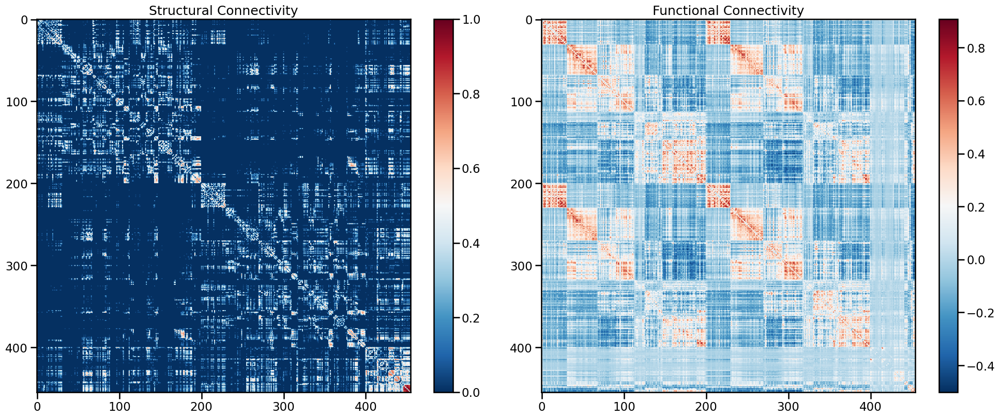

In [191]:
# Visualize structural and functional connectivity matrices
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

im1 = ax1.imshow(Y_sc, cmap='RdBu_r')
ax1.set_title('Structural Connectivity')
plt.colorbar(im1, ax=ax1)

im2 = ax2.imshow(Y_fc, cmap='RdBu_r')
ax2.set_title('Functional Connectivity') 
plt.colorbar(im2, ax=ax2)

plt.tight_layout()
plt.show()


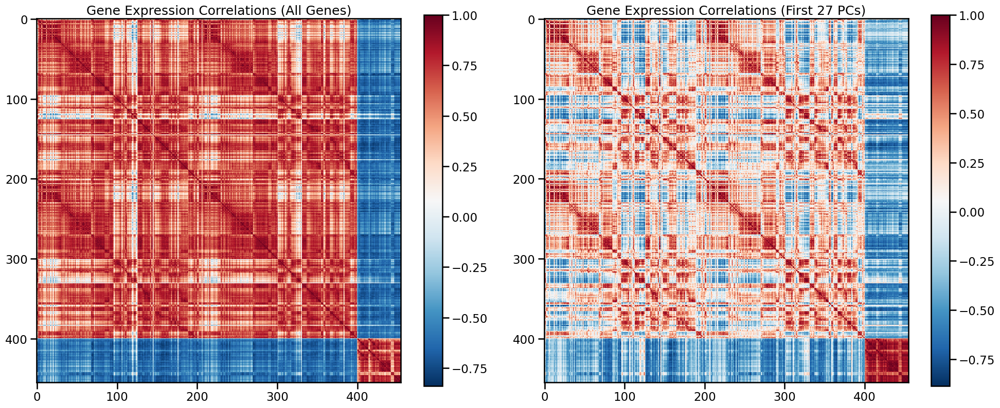

In [192]:
# Calculate gene expression correlations between regions
gene_corr = np.corrcoef(X)

# Calculate PCA of gene expression
pca = PCA()
X_pca = pca.fit_transform(X)

# Find number of components for 95% variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
n_components = np.argmax(cumulative_variance >= 0.95) + 1
X_pca_95 = X_pca[:, :n_components]

# Calculate correlations using PCA-reduced gene expression
gene_corr_pca = np.corrcoef(X_pca_95)

# Visualize gene expression correlations with PCA
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

im1 = ax1.imshow(gene_corr, cmap='RdBu_r')
ax1.set_title('Gene Expression Correlations (All Genes)')
plt.colorbar(im1, ax=ax1)

im2 = ax2.imshow(gene_corr_pca, cmap='RdBu_r')
ax2.set_title(f'Gene Expression Correlations (First {n_components} PCs)')
plt.colorbar(im2, ax=ax2)

plt.tight_layout()
plt.show()


Quick test to evaluate necessary number of components for spectral embedding

  return np.asarray(x, float)

  offsets = np.asanyarray(offsets, float)



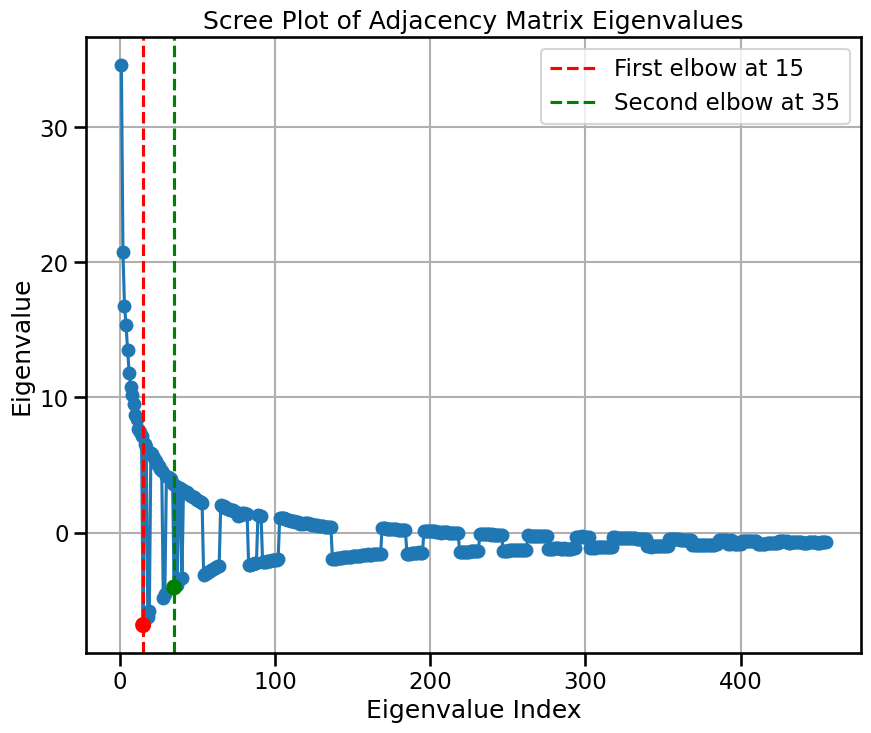

In [193]:
# Compute spectral embeddings using method 'A' on unmasked structural connectivity
adj_eigenvalues, adj_eigenvectors = eig(Y_sc)  # Use unmasked Y_sc

x_adj = range(1, len(adj_eigenvalues) + 1)
d1_adj = np.diff(adj_eigenvalues)
d2_adj = np.diff(d1_adj)
elbow_points_adj = np.argsort(np.abs(d2_adj))[-2:] + 2
first_elbow_adj = min(elbow_points_adj)
second_elbow_adj = max(elbow_points_adj)

# Plot eigenvalues for adjacency matrix embedding
plt.figure(figsize=(10, 8))
plt.plot(x_adj, adj_eigenvalues, marker='o')
plt.axvline(x=first_elbow_adj, color='r', linestyle='--', label=f'First elbow at {first_elbow_adj}')
plt.axvline(x=second_elbow_adj, color='g', linestyle='--', label=f'Second elbow at {second_elbow_adj}')
plt.scatter([first_elbow_adj, second_elbow_adj], 
           [adj_eigenvalues[first_elbow_adj-1], adj_eigenvalues[second_elbow_adj-1]], 
           color=['red', 'green'], s=100, zorder=5)
plt.xlabel('Eigenvalue Index')
plt.ylabel('Eigenvalue')
plt.title('Scree Plot of Adjacency Matrix Eigenvalues')
plt.legend()
plt.grid(True)
plt.show()

Dataset creation function

In [194]:
def construct_features_masked(X, Y_sc, Y_fc, mni_coords, mask_from, mask_to, spectrals):
    """
    Construct features for GLM modeling from input data matrices using masks to specify regions.
    
    Args:
        X: Full gene expression data matrix (AHBA_cortical_transcriptome)
        Y_sc: Full structural connectivity matrix
        Y_fc: Full functional connectivity matrix  
        mni_coords: MNI coordinates for all regions
        mask_from: Boolean mask for source regions (e.g. cortical_mask, left_hemi_mask)
        mask_to: Boolean mask for target regions (e.g. cortical_mask, right_hemi_mask)
        
    Returns:
        Dictionary containing feature arrays and embeddings for the masked subset
    """
    # Get masked coordinates and connectivity matrices
    mni_coords_from = mni_coords[mask_from]
    mni_coords_to = mni_coords[mask_to]
    
    # Get masked connectivity matrices
    Y_sc_masked = Y_sc[mask_from][:, mask_to]
    Y_fc_masked = Y_fc[mask_from][:, mask_to]

    # Compute spectral embeddings using method 'A' on unmasked structural connectivity
    _, eigenvectors = eig(Y_sc)  # Use unmasked Y_sc
    spectral_embeddings_from = eigenvectors[mask_from, :spectrals]  # Apply mask_from after computing eigenvectors
    spectral_embeddings_to = eigenvectors[mask_to, :spectrals]  # Apply mask_to after computing eigenvectors

    # Compute PCA from all gene expression data - determine components for 95% variance
    pca = PCA()
    X_pca_full = pca.fit_transform(X)  # Use unmasked X
    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    n_components = np.argmax(cumulative_variance >= 0.95) + 1
    # Get masked PCA components
    X_pca_masked_from = X_pca_full[mask_from]
    X_pca_masked_to = X_pca_full[mask_to]
    
    # Get masked gene expression
    X_masked_from = X[mask_from]
    X_masked_to = X[mask_to]

    # Calculate features between all pairs of masked regions
    num_from = len(mni_coords_from)
    num_to = len(mni_coords_to)
    
    distances = []
    sc_values = []
    fc_values = [] 
    gene_coexpression = []
    gene_PCA_coexpression = []
    spectral_similarity = []
    edge_PCA_embeddings = []
    edge_spectral_embeddings = []
    edge_mni_coords = []

    for i in range(num_from):
        for j in range(num_to):
            # Skip self-connections if masks overlap
            if mask_from is mask_to and i >= j:
                continue
                
            # Calculate euclidean distance between regions i and j
            dist = np.sqrt(np.sum((mni_coords_from[i] - mni_coords_to[j])**2))
            distances.append(dist)
            
            # Get connectivity values between regions i and j
            sc_values.append(Y_sc_masked[i, j])
            fc_values.append(Y_fc_masked[i, j])
            
            # Calculate gene expression similarity
            gene_coexp = np.corrcoef(X_masked_from[i], X_masked_to[j])[0,1]
            gene_coexpression.append(gene_coexp)
            
            # Calculate PCA-based gene expression similarity
            gene_pca_coexp = np.corrcoef(X_pca_masked_from[i], X_pca_masked_to[j])[0,1]
            gene_PCA_coexpression.append(gene_pca_coexp)
            
            # Calculate spectral embedding similarity
            spec_sim = np.corrcoef(spectral_embeddings_from[i], spectral_embeddings_to[j])[0,1]
            spectral_similarity.append(spec_sim)
            
            # Store embeddings
            edge_PCA_embeddings.append(np.concatenate([X_pca_masked_from[i], X_pca_masked_to[j]]))
            edge_spectral_embeddings.append(np.concatenate([spectral_embeddings_from[i], spectral_embeddings_to[j]]))
            edge_mni_coords.append(np.concatenate([mni_coords_from[i], mni_coords_to[j]]))

    # Convert lists to arrays
    features = {
        'distances': np.array(distances),
        'sc_values': np.array(sc_values),
        'fc_values': np.array(fc_values),
        'gene_coexpression': np.array(gene_coexpression),
        'gene_PCA_coexpression': np.array(gene_PCA_coexpression),
        'spectral_similarity': np.array(spectral_similarity),
        'edge_PCA_embeddings': np.array(edge_PCA_embeddings),
        'edge_spectral_embeddings': np.array(edge_spectral_embeddings),
        'edge_mni_coords': np.array(edge_mni_coords)
    }
    
    return features

In [196]:
# Call the function with our datasets
features = construct_features_masked(
    X,
    Y_sc, 
    Y_fc,
    mni_coords,
    mask_from=np.ones(X.shape[0], dtype=bool),
    mask_to=np.ones(X.shape[0], dtype=bool), 
    spectrals=13
)

print("Distances shape:", features['distances'].shape)
print("SC values shape:", features['sc_values'].shape)
print("FC values shape:", features['fc_values'].shape)
print("Gene coexpression shape:", features['gene_coexpression'].shape)
print("Gene PCA coexpression shape:", features['gene_PCA_coexpression'].shape)
print("Spectral similarity shape:", features['spectral_similarity'].shape)
print("Gene PCA shape:", features['edge_PCA_embeddings'].shape)
print("Spectral embeddings shape:", features['edge_spectral_embeddings'].shape)
print("MNI coordinates shape:", features['edge_mni_coords'].shape)

def fit_glm(features, feature_names, target_name='fc_values'):
    """
    Fit GLM model with specified features and calculate individual R^2 values
    
    Parameters:
    features (dict): Dictionary containing feature arrays
    feature_names (list): List of feature names to include in model
    target_name (str): Name of target feature to predict (default: 'fc_values')
    """
    # Get target variable
    target = features[target_name]
    
    # Prepare data for GLM
    X_glm = np.column_stack([features[name] for name in feature_names])
    X_glm = sm.add_constant(X_glm)  # Add constant
    
    print("Feature matrix shape:", X_glm.shape)
    
    # Fit full model
    model = sm.OLS(target, X_glm)
    results = model.fit()
    
    # Print full model summary
    print("\nFull model summary:")
    print(results.summary())
    
    # Calculate R^2 for individual features
    print("\nIndividual feature R^2 values:")
    r_squared_values = {}
    for name in feature_names:
        X_single = sm.add_constant(features[name])
        r_squared = sm.OLS(target, X_single).fit().rsquared
        r_squared_values[name] = r_squared
        print(f"R^2 for {name}: {r_squared:.3f}")
        
    return results, r_squared_values

# Run GLM with 1D features
feature_names = ['distances', 'sc_values', 'gene_coexpression', 'gene_PCA_coexpression', 'spectral_similarity']
results, r_squared_values = fit_glm(features, feature_names, target_name='fc_values')

# Run GLM with all features
feature_names = ['distances', 'sc_values', 'gene_coexpression', 'gene_PCA_coexpression', 'spectral_similarity', 'edge_PCA_embeddings', 'edge_spectral_embeddings', 'edge_mni_coords']
results, r_squared_values = fit_glm(features, feature_names, target_name='fc_values')

Distances shape: (207025,)
SC values shape: (207025,)
FC values shape: (207025,)
Gene coexpression shape: (207025,)
Gene PCA coexpression shape: (207025,)
Spectral similarity shape: (207025,)
Gene PCA shape: (207025, 910)
Spectral embeddings shape: (207025, 26)
MNI coordinates shape: (207025, 6)
Feature matrix shape: (207025, 6)

Full model summary:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.123
Model:                            OLS   Adj. R-squared:                  0.123
Method:                 Least Squares   F-statistic:                     5788.
Date:                Tue, 18 Mar 2025   Prob (F-statistic):               0.00
Time:                        17:17:43   Log-Likelihood:                 71446.
No. Observations:              207025   AIC:                        -1.429e+05
Df Residuals:                  207019   BIC:                        -1.428e+05
Df Model:       

In [197]:
def analyze_feature_correlations(features, feature_names=None, labels=None):
    """
    Analyze correlations between features and check for NaN values.
    
    Parameters:
    features (dict): Dictionary containing feature arrays
    feature_names (list): List of feature names to analyze. If None, uses default list.
    labels (list): List of labels for plotting. If None, uses default list.
    """
    if feature_names is None:
        feature_names = ['distances', 'sc_values', 'fc_values', 'gene_coexpression', 
                        'gene_PCA_coexpression', 'spectral_similarity']
    if labels is None:
        labels = ['Distance', 'SC', 'FC', 'Gene Coexp', 'Gene PCA', 'Spectral']
        
    # Check for NaNs in each feature
    for name in feature_names:
        nan_mask = np.isnan(features[name])
        if np.any(nan_mask):
            print(f"NaNs detected in {name} at indices: {np.where(nan_mask)}")

    # Compute correlations between all pairs of features
    n = len(feature_names)
    correlations = np.zeros((n, n))

    for i in range(n):
        for j in range(n):
            correlations[i,j] = np.corrcoef(features[feature_names[i]], 
                                          features[feature_names[j]])[0,1]

    # Create heatmap
    plt.figure(figsize=(10,8))
    sns.heatmap(correlations,
                xticklabels=labels,
                yticklabels=labels, 
                annot=True,
                fmt='.3f',
                cmap='RdBu_r',
                center=0,
                vmin=-1,
                vmax=1,
                square=True)
    plt.title('Correlation heatmap')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    # Print individual correlations for reference
    print("\nDetailed correlations:")
    for i in range(n):
        for j in range(i+1,n):
            print(f"Correlation between {labels[i]} and {labels[j]}: {correlations[i,j]:.3f}")
            
    return correlations

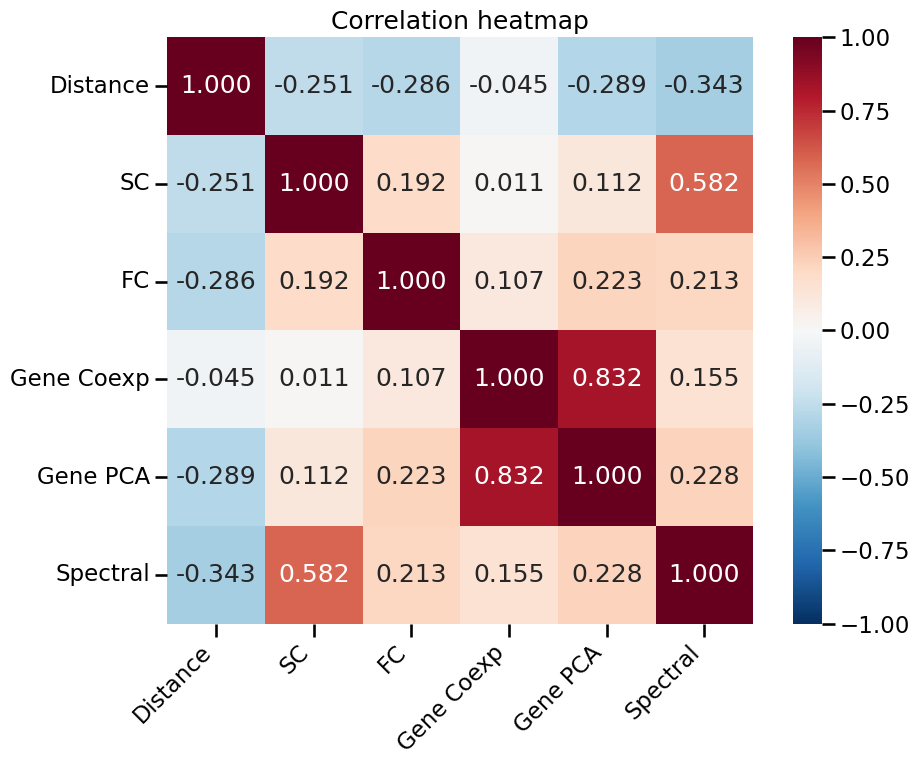


Detailed correlations:
Correlation between Distance and SC: -0.251
Correlation between Distance and FC: -0.286
Correlation between Distance and Gene Coexp: -0.045
Correlation between Distance and Gene PCA: -0.289
Correlation between Distance and Spectral: -0.343
Correlation between SC and FC: 0.192
Correlation between SC and Gene Coexp: 0.011
Correlation between SC and Gene PCA: 0.112
Correlation between SC and Spectral: 0.582
Correlation between FC and Gene Coexp: 0.107
Correlation between FC and Gene PCA: 0.223
Correlation between FC and Spectral: 0.213
Correlation between Gene Coexp and Gene PCA: 0.832
Correlation between Gene Coexp and Spectral: 0.155
Correlation between Gene PCA and Spectral: 0.228


array([[ 1.        , -0.25137925, -0.28634385, -0.04467422, -0.28928102,
        -0.34302166],
       [-0.25137925,  1.        ,  0.19152111,  0.01069392,  0.11193408,
         0.5820105 ],
       [-0.28634385,  0.19152111,  1.        ,  0.10721283,  0.22313287,
         0.21328673],
       [-0.04467422,  0.01069392,  0.10721283,  1.        ,  0.83205725,
         0.15510085],
       [-0.28928102,  0.11193408,  0.22313287,  0.83205725,  1.        ,
         0.22808737],
       [-0.34302166,  0.5820105 ,  0.21328673,  0.15510085,  0.22808737,
         1.        ]])

In [198]:
# Call the function with default parameters
analyze_feature_correlations(features)

  return a * np.exp(-b * x) + c

  warnings.warn('Covariance of the parameters could not be estimated',



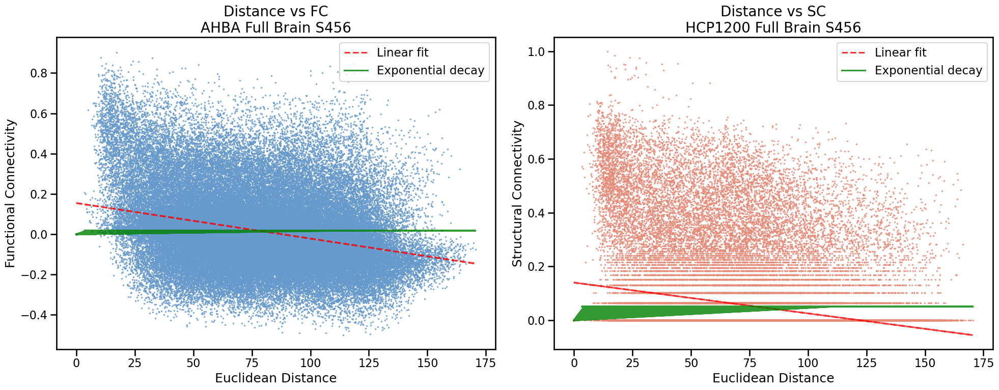

In [ ]:
# Create figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# Plot distance vs FC
scatter1 = ax1.scatter(features['distances'], features['fc_values'], 
                      color='#6699cc', alpha=0.5, s=1)  # Darker blue
ax1.set_xlabel('Euclidean Distance', fontsize=18)
ax1.set_ylabel('Functional Connectivity', fontsize=18)
ax1.set_title('Distance vs FC\nAHBA Full Brain S456', fontsize=20)
ax1.tick_params(axis='both', which='major', labelsize=16)

# Plot distance vs SC 
scatter2 = ax2.scatter(features['distances'], features['sc_values'],
                      color='#e68a77', alpha=0.5, s=1)  # Darker salmon
ax2.set_xlabel('Euclidean Distance', fontsize=18)
ax2.set_ylabel('Structural Connectivity', fontsize=18)
ax2.set_title('Distance vs SC\nHCP1200 Full Brain S456', fontsize=20)
ax2.tick_params(axis='both', which='major', labelsize=16)

plt.tight_layout()
plt.show()

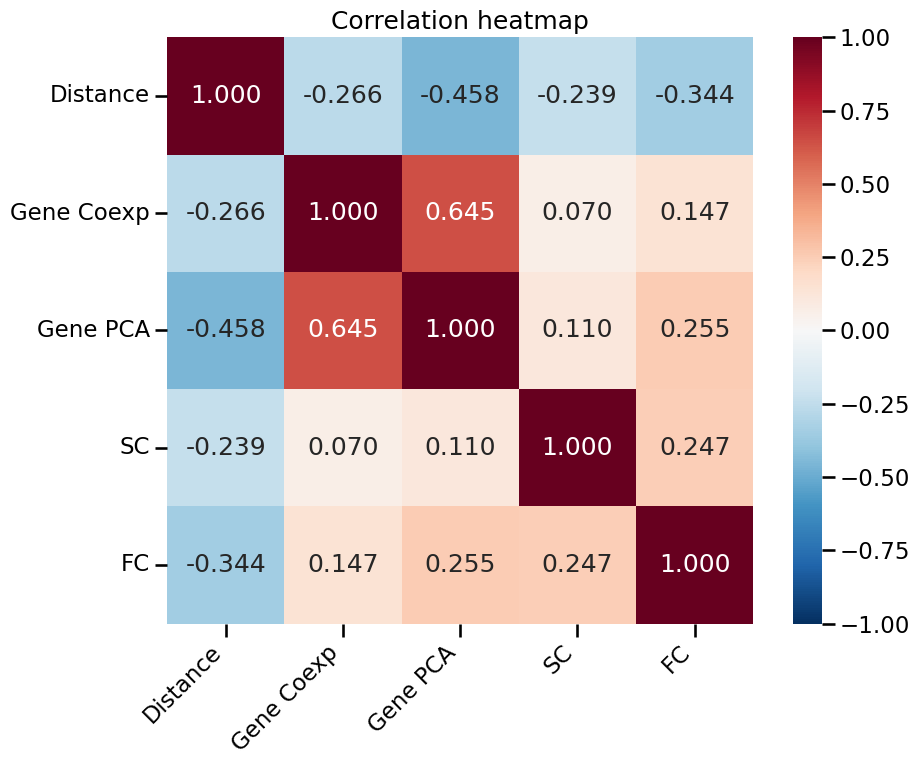


Detailed correlations:
Correlation between Distance and Gene Coexp: -0.266
Correlation between Distance and Gene PCA: -0.458
Correlation between Distance and SC: -0.239
Correlation between Distance and FC: -0.344
Correlation between Gene Coexp and Gene PCA: 0.645
Correlation between Gene Coexp and SC: 0.070
Correlation between Gene Coexp and FC: 0.147
Correlation between Gene PCA and SC: 0.110
Correlation between Gene PCA and FC: 0.255
Correlation between SC and FC: 0.247


array([[ 1.        , -0.26587731, -0.45830051, -0.23853711, -0.3442392 ],
       [-0.26587731,  1.        ,  0.64458323,  0.07030201,  0.14731359],
       [-0.45830051,  0.64458323,  1.        ,  0.11040392,  0.25537497],
       [-0.23853711,  0.07030201,  0.11040392,  1.        ,  0.24673915],
       [-0.3442392 ,  0.14731359,  0.25537497,  0.24673915,  1.        ]])

In [84]:
feature_names = ['distances', 'gene_coexpression', 'gene_PCA_coexpression', 'sc_values', 'fc_values',]
labels = ['Distance', 'Gene Coexp', 'Gene PCA', 'SC', 'FC',]

analyze_feature_correlations(features, feature_names, labels)

Right hemisphere only

In [152]:
features = construct_features_masked(
    X=AHBA_cortical_transcriptome,
    Y_sc=HCP1200_S456_structural_count_cortical, 
    Y_fc=UKBB_S456_functional_conn_cortical,
    mni_coords=cortical_mni_coords,
    mask_from=right_hemi_mask,
    mask_to=right_hemi_mask
)

print("Distances shape:", features['distances'].shape)
print("SC values shape:", features['sc_values'].shape)
print("FC values shape:", features['fc_values'].shape)
print("Gene coexpression shape:", features['gene_coexpression'].shape)
print("Gene PCA coexpression shape:", features['gene_PCA_coexpression'].shape)
print("Spectral similarity shape:", features['spectral_similarity'].shape)
print("Gene PCA shape:", features['edge_PCA_embeddings'].shape)
print("Spectral embeddings shape:", features['edge_spectral_embeddings'].shape)
print("MNI coordinates shape:", features['edge_mni_coords'].shape)


Distances shape: (10731,)
SC values shape: (10731,)
FC values shape: (10731,)
Gene coexpression shape: (10731,)
Gene PCA coexpression shape: (10731,)
Spectral similarity shape: (10731,)
Gene PCA shape: (10731, 678)
Spectral embeddings shape: (10731, 28)
MNI coordinates shape: (10731, 6)


In [153]:
# Run GLM with 1D features
feature_names = ['distances', 'sc_values', 'gene_coexpression', 'gene_PCA_coexpression', 'spectral_similarity']
results, r_squared_values = fit_glm(features, feature_names, target_name='fc_values')

# Run GLM with all features
feature_names = ['distances', 'sc_values', 'gene_coexpression', 'gene_PCA_coexpression', 'spectral_similarity', 'edge_PCA_embeddings', 'edge_spectral_embeddings', 'edge_mni_coords']
results, r_squared_values = fit_glm(features, feature_names, target_name='fc_values')

Feature matrix shape: (10731, 6)

Full model summary:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.175
Model:                            OLS   Adj. R-squared:                  0.175
Method:                 Least Squares   F-statistic:                     456.3
Date:                Tue, 10 Dec 2024   Prob (F-statistic):               0.00
Time:                        15:28:42   Log-Likelihood:                 3072.4
No. Observations:               10731   AIC:                            -6133.
Df Residuals:                   10725   BIC:                            -6089.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------

Interhemispheric connections only

In [154]:
features = construct_features_masked(
    X=AHBA_cortical_transcriptome,
    Y_sc=HCP1200_S456_structural_count_cortical, 
    Y_fc=UKBB_S456_functional_conn_cortical,
    mni_coords=cortical_mni_coords,
    mask_from=left_hemi_mask,
    mask_to=right_hemi_mask
)

print("Distances shape:", features['distances'].shape)
print("SC values shape:", features['sc_values'].shape)
print("FC values shape:", features['fc_values'].shape)
print("Gene coexpression shape:", features['gene_coexpression'].shape)
print("Gene PCA coexpression shape:", features['gene_PCA_coexpression'].shape)
print("Spectral similarity shape:", features['spectral_similarity'].shape)
print("Gene PCA shape:", features['edge_PCA_embeddings'].shape)
print("Spectral embeddings shape:", features['edge_spectral_embeddings'].shape)
print("MNI coordinates shape:", features['edge_mni_coords'].shape)


Distances shape: (28224,)
SC values shape: (28224,)
FC values shape: (28224,)
Gene coexpression shape: (28224,)
Gene PCA coexpression shape: (28224,)
Spectral similarity shape: (28224,)
Gene PCA shape: (28224, 678)
Spectral embeddings shape: (28224, 28)
MNI coordinates shape: (28224, 6)


In [155]:
# Run GLM with 1D features
feature_names = ['distances', 'sc_values', 'gene_coexpression', 'gene_PCA_coexpression', 'spectral_similarity']
results, r_squared_values = fit_glm(features, feature_names, target_name='fc_values')

# Run GLM with all features
feature_names = ['distances', 'sc_values', 'gene_coexpression', 'gene_PCA_coexpression', 'spectral_similarity', 'edge_PCA_embeddings', 'edge_spectral_embeddings', 'edge_mni_coords']
results, r_squared_values = fit_glm(features, feature_names, target_name='fc_values')

Feature matrix shape: (28224, 6)

Full model summary:
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.090
Model:                            OLS   Adj. R-squared:                  0.090
Method:                 Least Squares   F-statistic:                     561.3
Date:                Tue, 10 Dec 2024   Prob (F-statistic):               0.00
Time:                        15:28:50   Log-Likelihood:                 7890.9
No. Observations:               28224   AIC:                        -1.577e+04
Df Residuals:                   28218   BIC:                        -1.572e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------

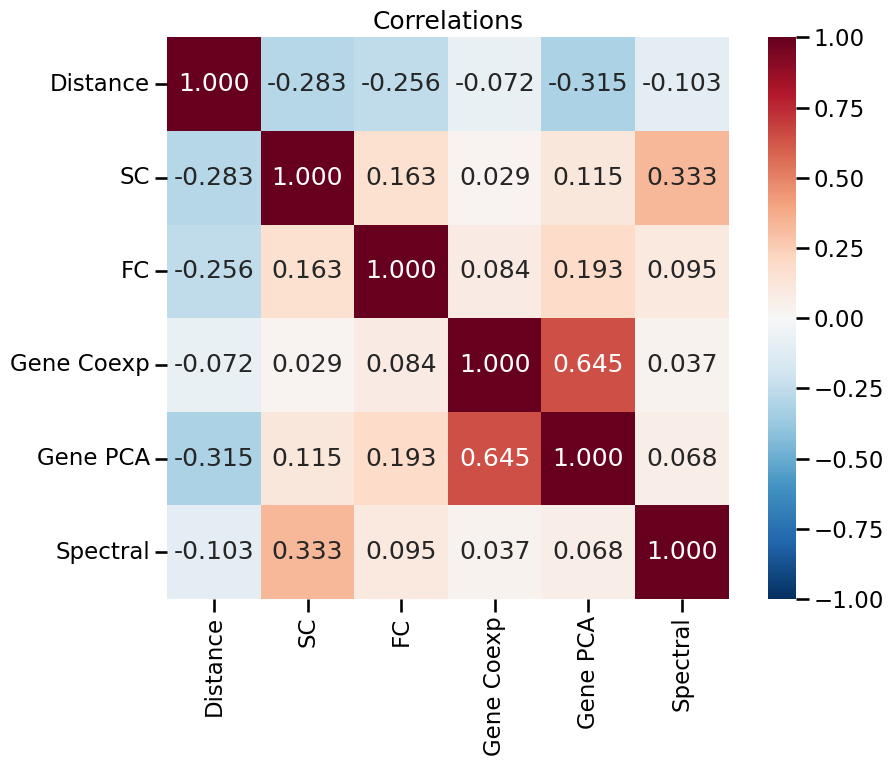


Detailed correlations:
Correlation between Distance and SC: -0.283
Correlation between Distance and FC: -0.256
Correlation between Distance and Gene Coexp: -0.072
Correlation between Distance and Gene PCA: -0.315
Correlation between Distance and Spectral: -0.103
Correlation between SC and FC: 0.163
Correlation between SC and Gene Coexp: 0.029
Correlation between SC and Gene PCA: 0.115
Correlation between SC and Spectral: 0.333
Correlation between FC and Gene Coexp: 0.084
Correlation between FC and Gene PCA: 0.193
Correlation between FC and Spectral: 0.095
Correlation between Gene Coexp and Gene PCA: 0.645
Correlation between Gene Coexp and Spectral: 0.037
Correlation between Gene PCA and Spectral: 0.068


array([[ 1.        , -0.28266103, -0.25598233, -0.0718463 , -0.31463783,
        -0.10282188],
       [-0.28266103,  1.        ,  0.16271542,  0.02933041,  0.11474613,
         0.332918  ],
       [-0.25598233,  0.16271542,  1.        ,  0.08390841,  0.19253781,
         0.09487894],
       [-0.0718463 ,  0.02933041,  0.08390841,  1.        ,  0.644547  ,
         0.03694787],
       [-0.31463783,  0.11474613,  0.19253781,  0.644547  ,  1.        ,
         0.06829012],
       [-0.10282188,  0.332918  ,  0.09487894,  0.03694787,  0.06829012,
         1.        ]])

In [108]:
# Call the function with default parameters
analyze_feature_correlations(features)